In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.coordinates import SkyCoord
import astropy.units as u
from funcs import *

# === Load and preprocess ===
with fits.open("./pandas_goodstar_bright_sr.fits") as hdul:
    data = hdul[1].data
    panda = pd.DataFrame(data.astype(data.dtype.newbyteorder('=')))

panda = panda.rename(columns={'RA': 'RA_DEG', 'Dec': 'DEC_DEG'})

# === Compute deprojected radius ===
panda = compute_deprojected_radius(panda)

# === Compute non-deprojected (projected) radius ===
distance_kpc = 859
center = SkyCoord(ra=23.4621 * u.deg, dec=30.6602 * u.deg)
stars = SkyCoord(ra=panda['RA_DEG'].values * u.deg, dec=panda['DEC_DEG'].values * u.deg)
separation_rad = center.separation(stars).radian
panda['projected_radius_kpc'] = separation_rad * distance_kpc

# === Add CMD photometry ===
panda['color'] = panda['g'] - panda['i']
panda['mag'] = panda['i']

# === Print summary ===
print(f"RA range:  {panda['RA_DEG'].min():.4f}° to {panda['RA_DEG'].max():.4f}°")
print(f"Dec range: {panda['DEC_DEG'].min():.4f}° to {panda['DEC_DEG'].max():.4f}°")
print(f"Deprojected radius: {panda['r_deproj_kpc'].min():.2f} to {panda['r_deproj_kpc'].max():.2f} kpc")
print(f"Projected radius:    {panda['projected_radius_kpc'].min():.2f} to {panda['projected_radius_kpc'].max():.2f} kpc")
print(f"Number of stars: {len(panda):,}")

# === Load classified stars for overlay ===
df = load_filtered_fits("/Users/calvinsridhara/Documents/GitHub/M33_Analysis/Tables/m33_vels_stars_inc22B_donedupes.fits")
df = classify_age_groups(df)
df = compute_deprojected_radius(df)
df = df[(df['g'].notnull()) & (df['i'].notnull())].copy()
df['color'] = df['g'] - df['i']
df['mag'] = df['i']

RA range:  19.7848° to 26.9907°
Dec range: 27.5574° to 33.7542°
Deprojected radius: 0.07 to 76.88 kpc
Projected radius:    0.05 to 47.43 kpc
Number of stars: 599,354
Number of stars in each age group:
age_group
old                  2361
young_unconfirmed    1111
young                 947
int                   817
unclassified           20
Name: count, dtype: int64


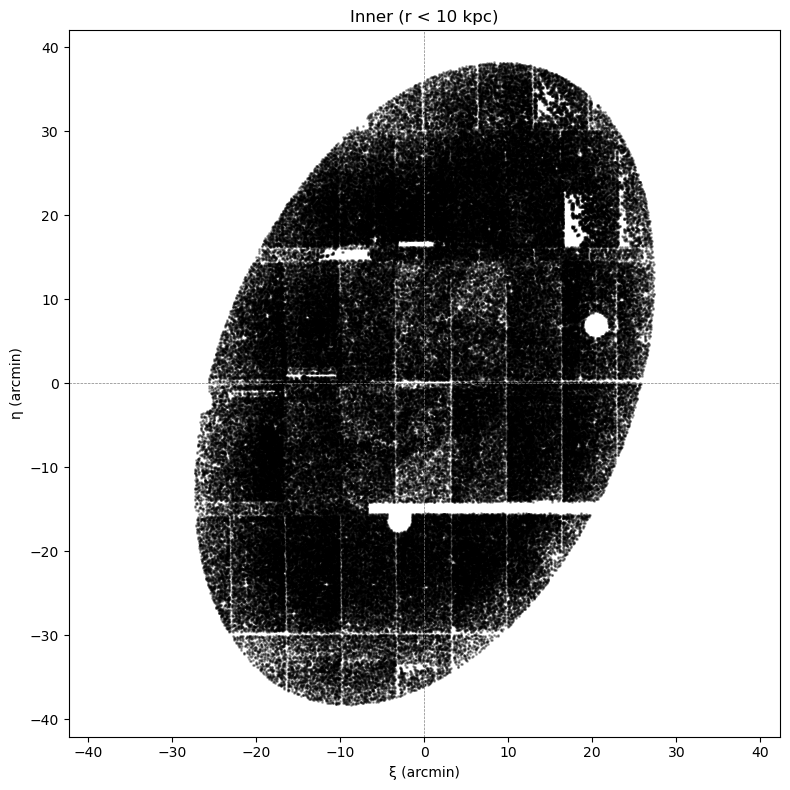

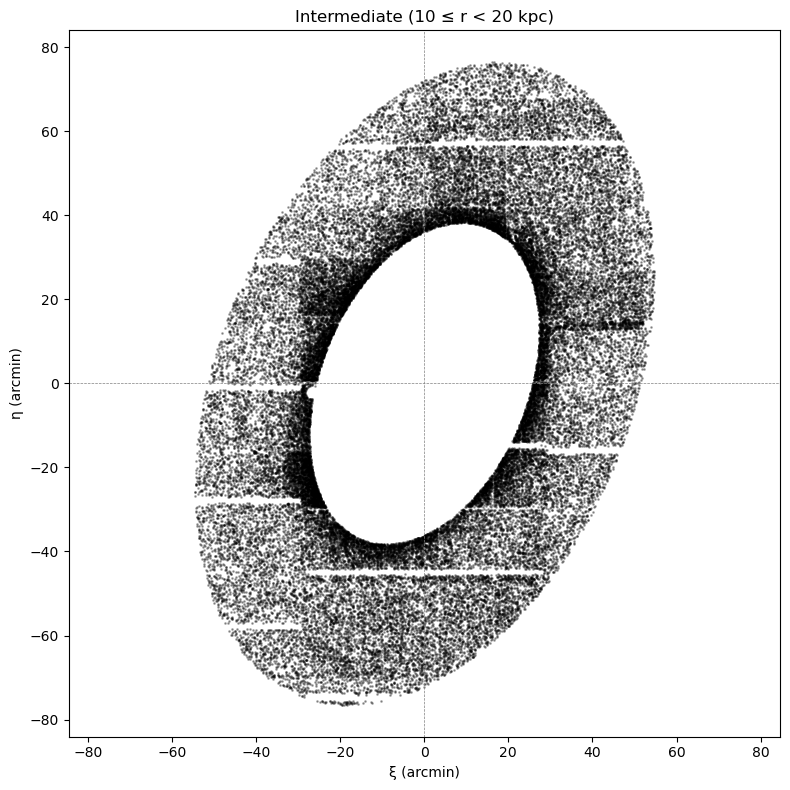

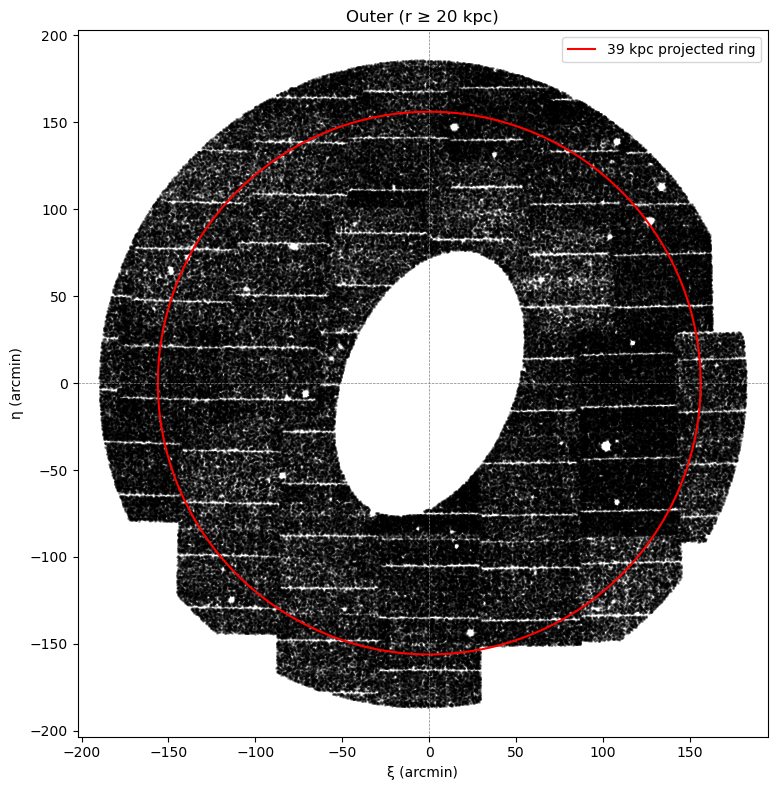

In [24]:
from astropy.coordinates import SkyCoord
import astropy.units as u
import matplotlib.pyplot as plt
import numpy as np

# === Compute ξ/η coordinates ===
center = SkyCoord(ra=23.4621 * u.deg, dec=30.6602 * u.deg)
coords = SkyCoord(ra=panda['RA_DEG'].values * u.deg, dec=panda['DEC_DEG'].values * u.deg)
offset = coords.transform_to(center.skyoffset_frame())
panda['xi'] = offset.lon.arcminute
panda['eta'] = offset.lat.arcminute

# === Parameters ===
distance_kpc = 859
ring_kpc_projected = 39  # projected (not deprojected!) radius

# === Radial masks using deprojected radius (kept for population definition) ===
radial_masks = {
    'Inner (r < 10 kpc)': panda['r_deproj_kpc'] < 10,
    'Intermediate (10 ≤ r < 20 kpc)': (panda['r_deproj_kpc'] >= 10) & (panda['r_deproj_kpc'] < 20),
    'Outer (r ≥ 20 kpc)': panda['r_deproj_kpc'] >= 20
}

# === Plot ξ/η with circular ring on outer ===
for title, mask in radial_masks.items():
    plt.figure(figsize=(8, 8))
    plt.scatter(panda.loc[mask, 'xi'], panda.loc[mask, 'eta'], s=1, c='black', alpha=0.3)

    if 'Outer' in title:
        # Compute projected radius in arcminutes
        ring_rad = ring_kpc_projected / distance_kpc  # radians
        ring_arcmin = ring_rad * (180 / np.pi) * 60   # arcmin

        # Parametrize circle
        phi = np.linspace(0, 2 * np.pi, 500)
        xi_circle = ring_arcmin * np.cos(phi)
        eta_circle = ring_arcmin * np.sin(phi)

        plt.plot(xi_circle, eta_circle, color='red', linewidth=1.5, label=f'{ring_kpc_projected} kpc projected ring')
        plt.legend()

    plt.xlabel('ξ (arcmin)')
    plt.ylabel('η (arcmin)')
    plt.title(f'{title}')
    plt.axhline(0, color='gray', lw=0.5, linestyle='--')
    plt.axvline(0, color='gray', lw=0.5, linestyle='--')
    plt.axis('equal')
    plt.tight_layout()
    plt.show()

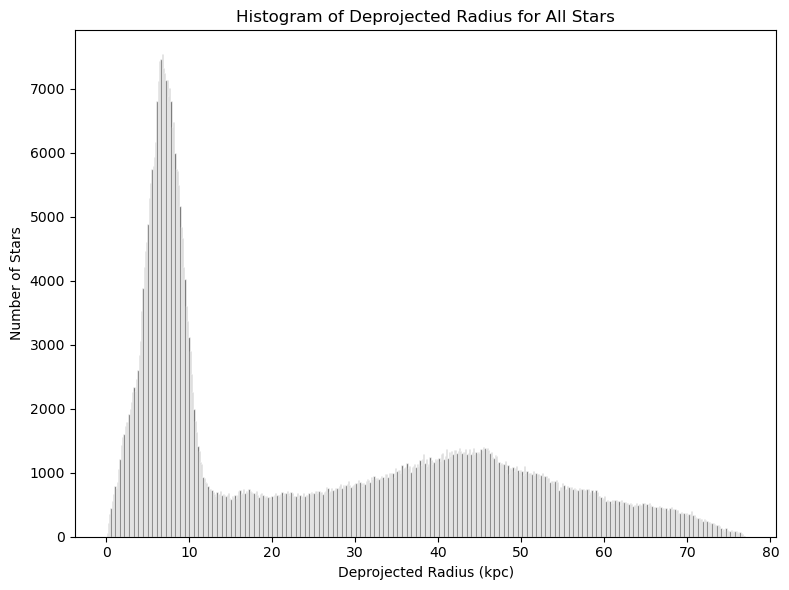

In [26]:
plt.figure(figsize=(8, 6))
plt.hist(panda['r_deproj_kpc'], bins=500, color='black', edgecolor='white', alpha=0.7)
plt.xlabel('Deprojected Radius (kpc)')
plt.ylabel('Number of Stars')
plt.title('Histogram of Deprojected Radius for All Stars')
plt.tight_layout()
plt.show()

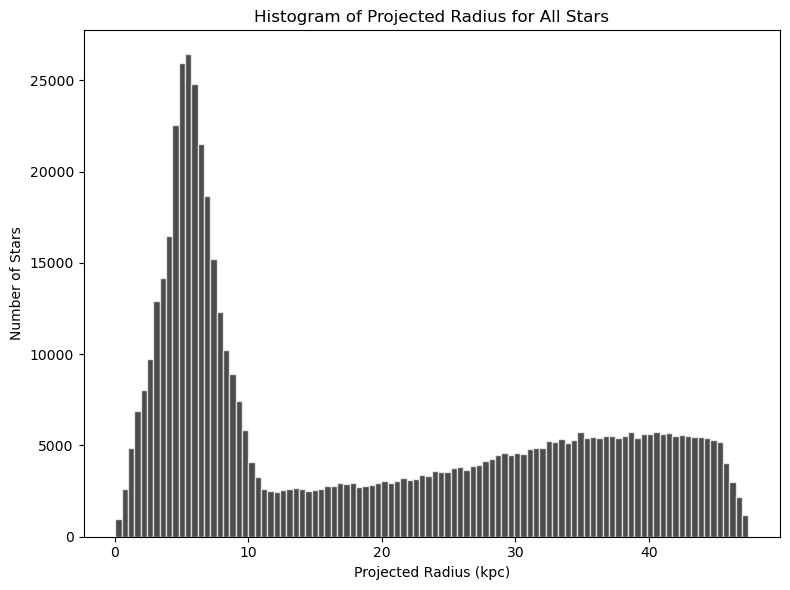

In [34]:
plt.figure(figsize=(8, 6))
plt.hist(panda['projected_radius_kpc'], bins=100, color='black', edgecolor='white', alpha=0.7)
plt.xlabel('Projected Radius (kpc)')
plt.ylabel('Number of Stars')
plt.title('Histogram of Projected Radius for All Stars')
plt.tight_layout()
plt.show()

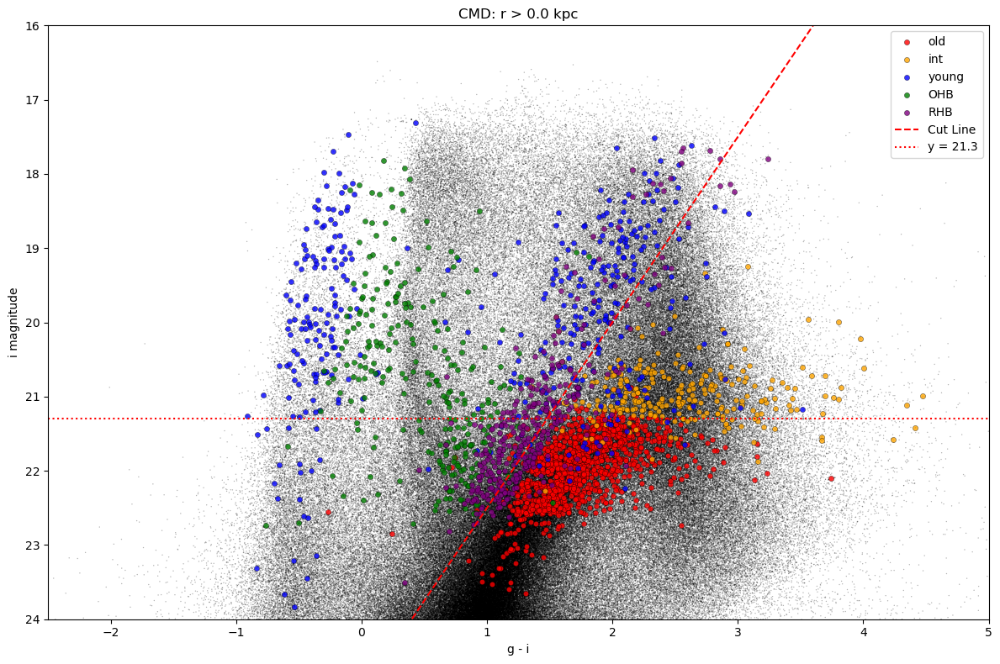

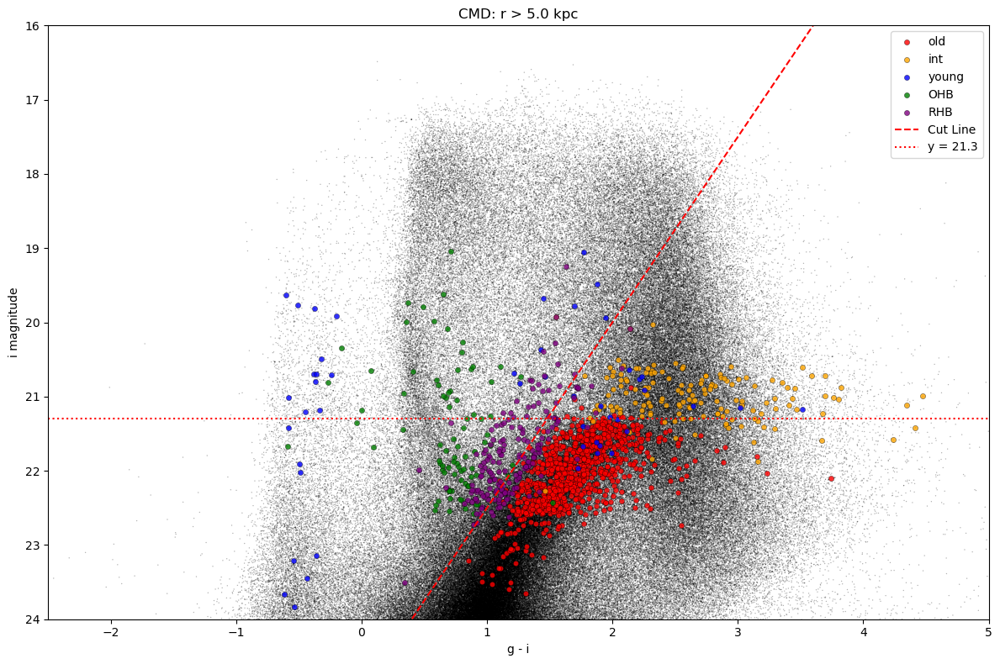

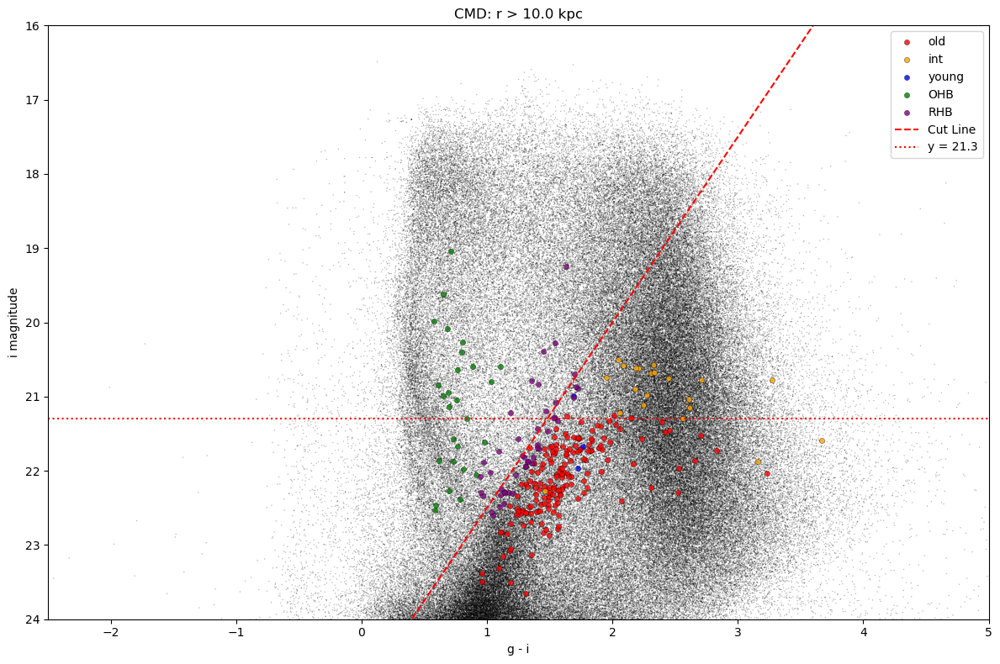

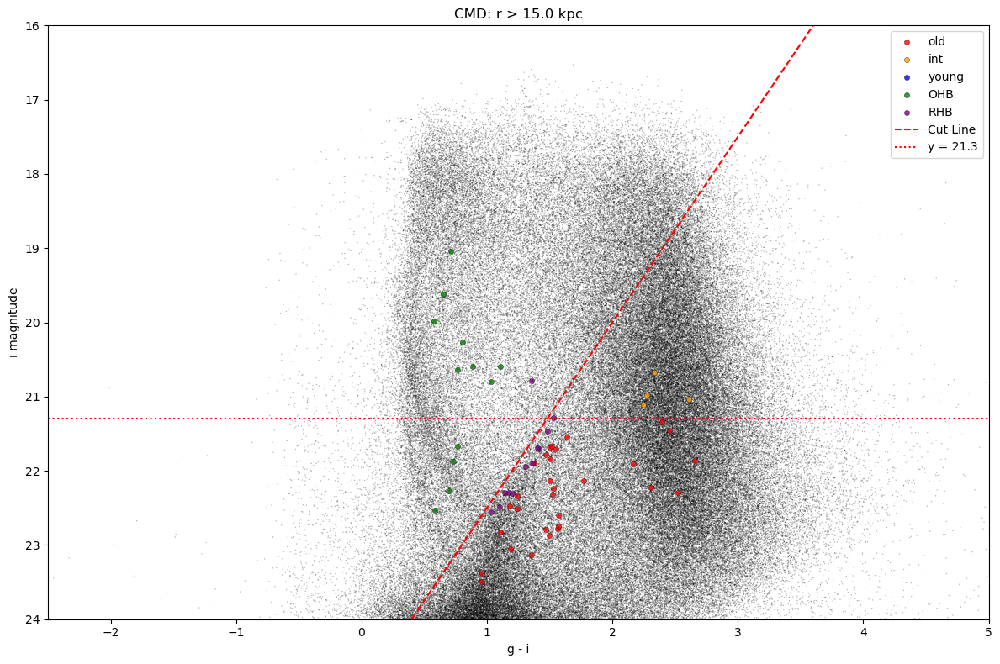

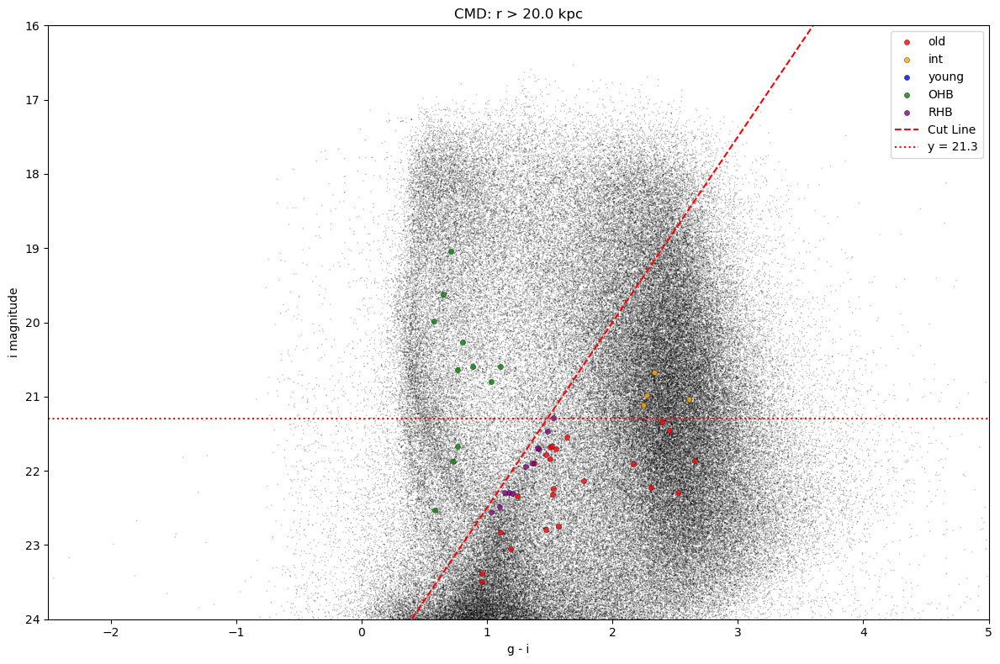

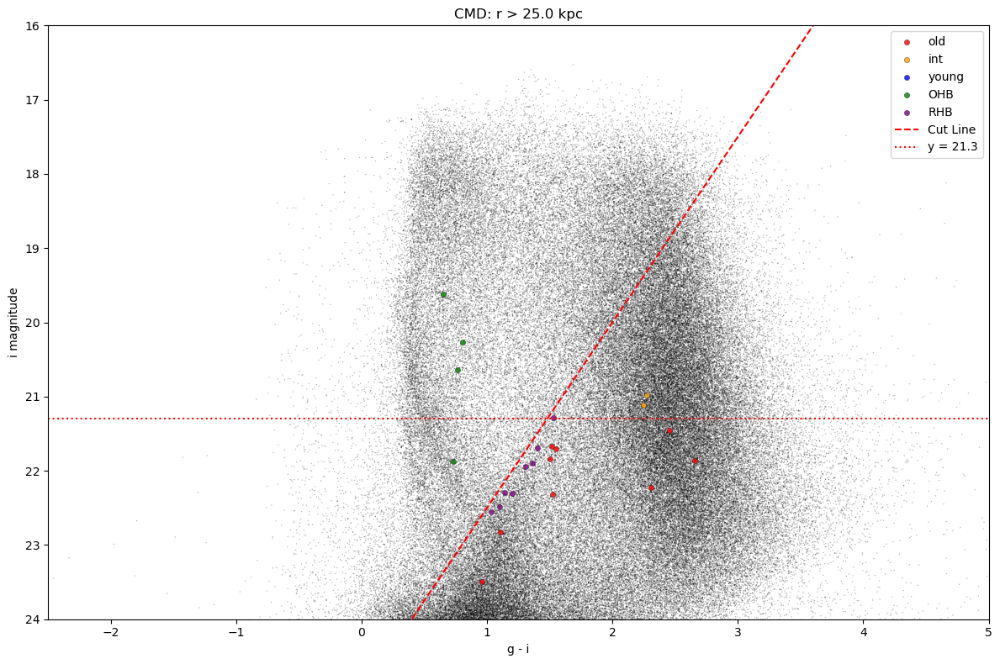

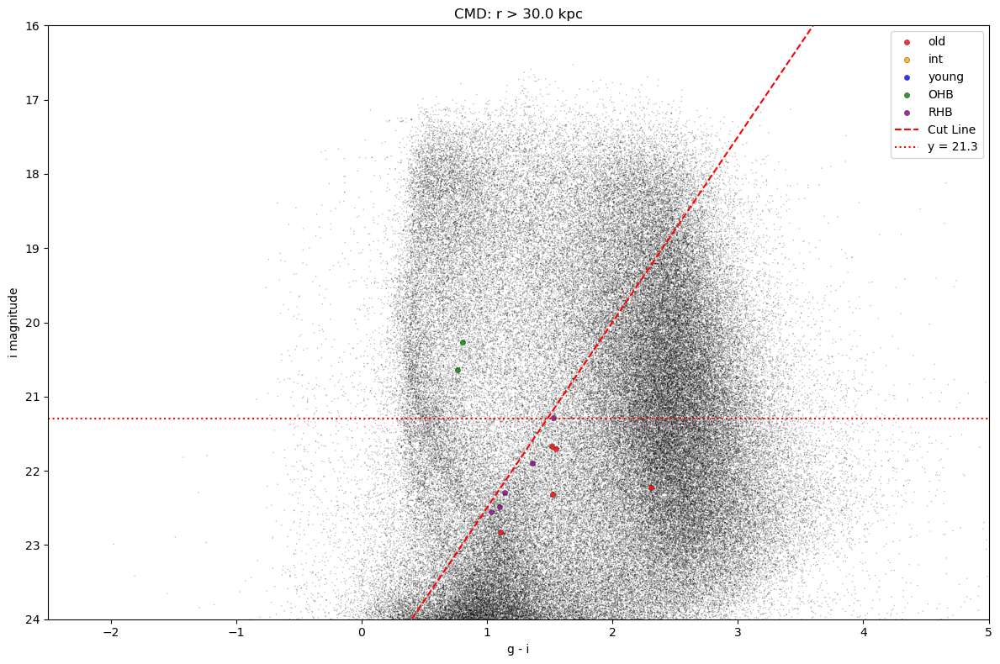

In [52]:
colors = {'young': 'blue', 'int': 'orange', 'old': 'red', 'OHB': 'green', 'RHB': 'purple'}

# === CMD plots in radial bins ===
bins = np.arange(0, 35, 5)

for r_min in bins:
    subset = panda[panda['r_deproj_kpc'] > r_min].copy()
    plt.figure(figsize=(12, 8))
    plt.scatter(subset['color'], subset['mag'], s=1, alpha=0.3, c='k', edgecolors='none')

    for group in ['old', 'int', 'young']:
        stars = df[(df['age_group'] == group) & (df['r_deproj_kpc'] > r_min)]
        plt.scatter(
            stars['color'], stars['mag'],
            s=20, alpha=0.8, color=colors[group],
            label=group, edgecolors='k', linewidths=0.3
        )

    # Add OHB stars
    ohb = df[(df['OHB_SEL'] == 1) & (df['r_deproj_kpc'] > r_min) & (df['age_group'] != 'young')]
    plt.scatter(
        ohb['color'], ohb['mag'],
        s=20, alpha=0.8, color=colors['OHB'],
        label='OHB', edgecolors='k', linewidths=0.3
    )

    # Add RHB stars
    rhb = df[(df['RHB_SEL'] == 1) & (df['r_deproj_kpc'] > r_min) & (df['age_group'] != 'young')]
    plt.scatter(
        rhb['color'], rhb['mag'],
        s=20, alpha=0.8, color=colors['RHB'],
        label='RHB', edgecolors='k', linewidths=0.3
    )
    slope = -2.5      # Set your desired slope here
    intercept = 25

    x_vals = np.linspace(-2.5, 5, 500)
    y_vals = slope * x_vals + intercept
    plt.plot(x_vals, y_vals, color='red', linestyle='--', linewidth=1.5, label='Cut Line')

    plt.axhline(y=21.3, color='red', linestyle=':', linewidth=1.5, label='y = 21.3')

    plt.gca().invert_yaxis()
    plt.xlabel('g - i')
    plt.ylabel('i magnitude')
    plt.xlim(-2.5, 5)
    plt.ylim(24, 16)
    plt.title(f'CMD: r > {r_min:.1f} kpc')
    plt.legend()
    plt.tight_layout()
    plt.show()

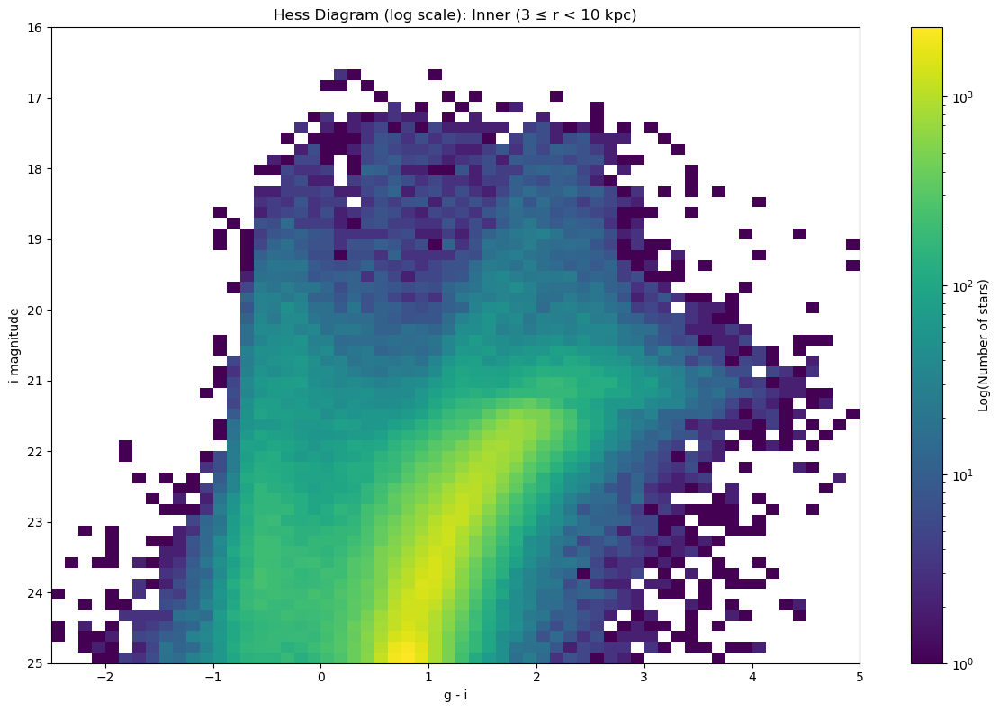

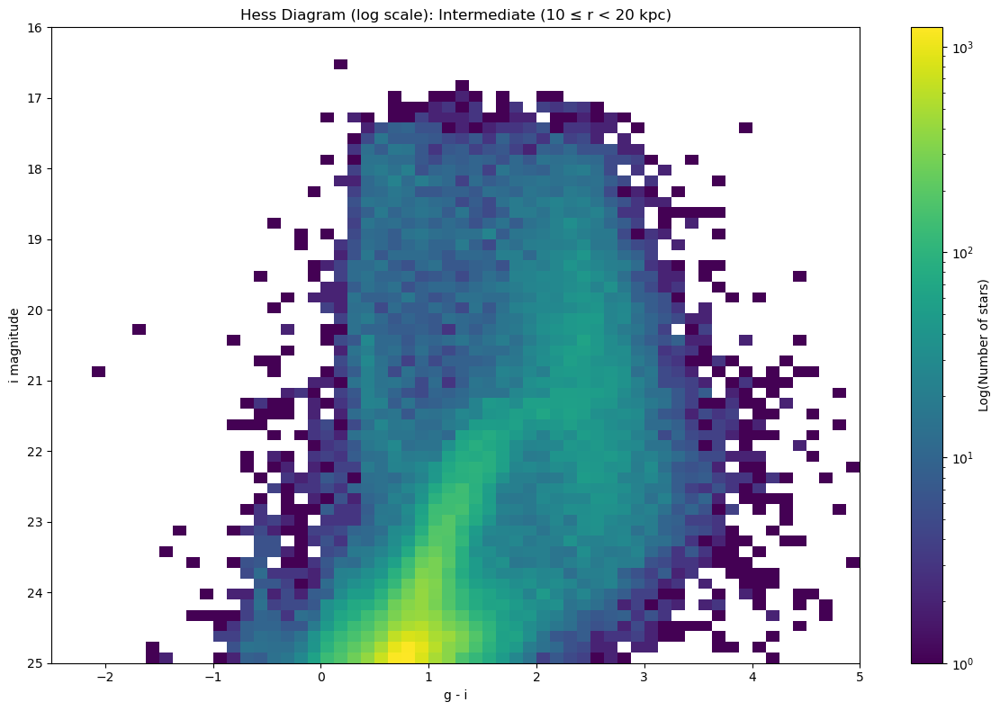

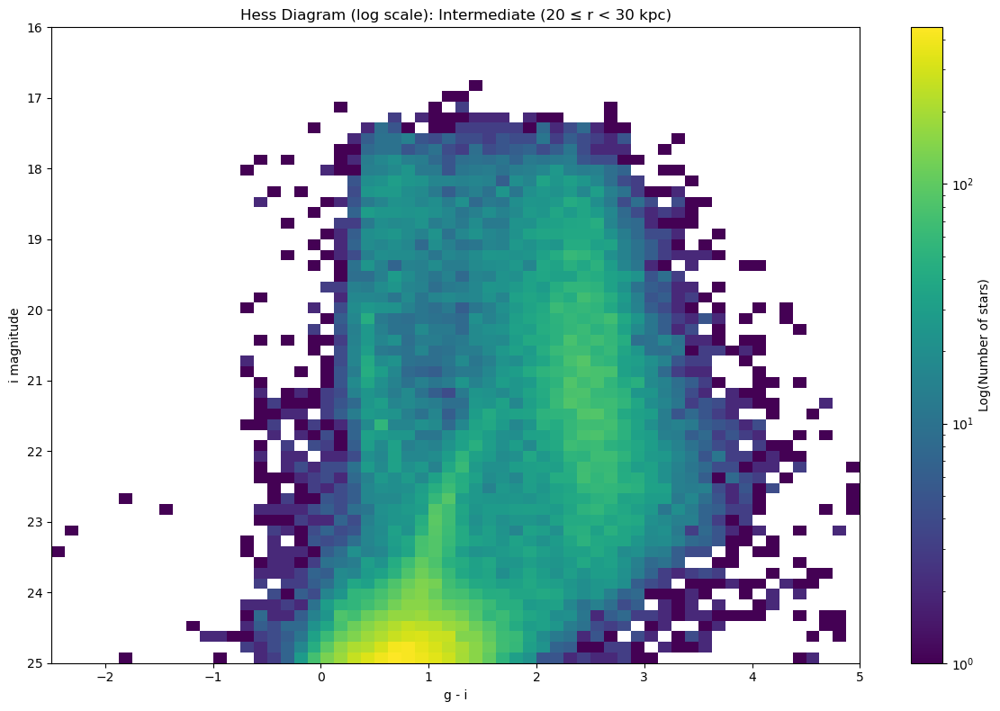

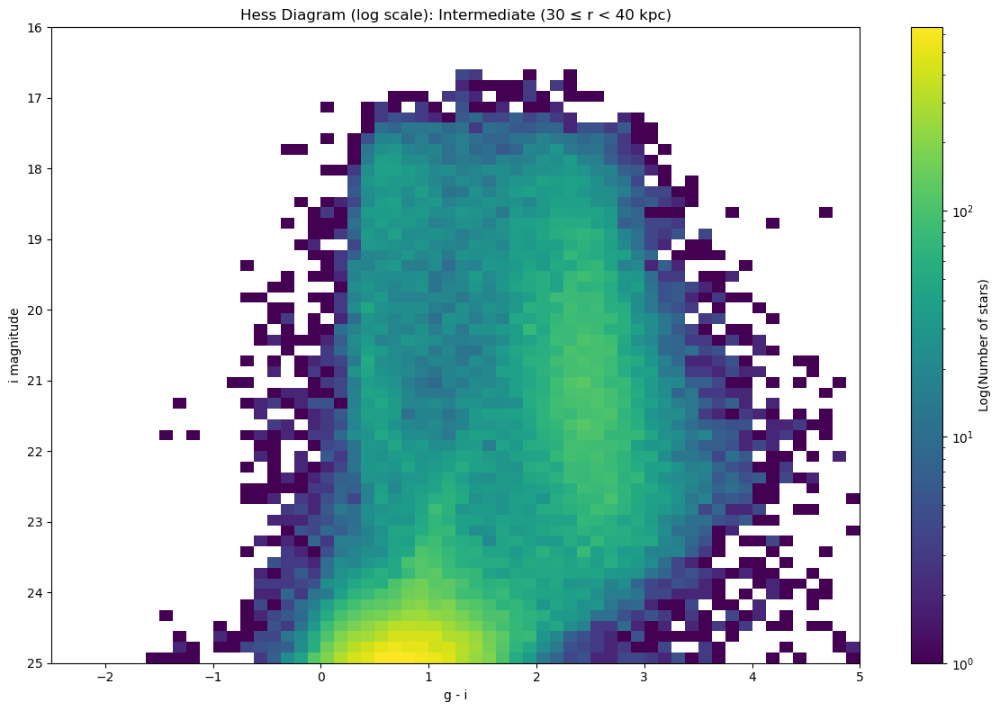

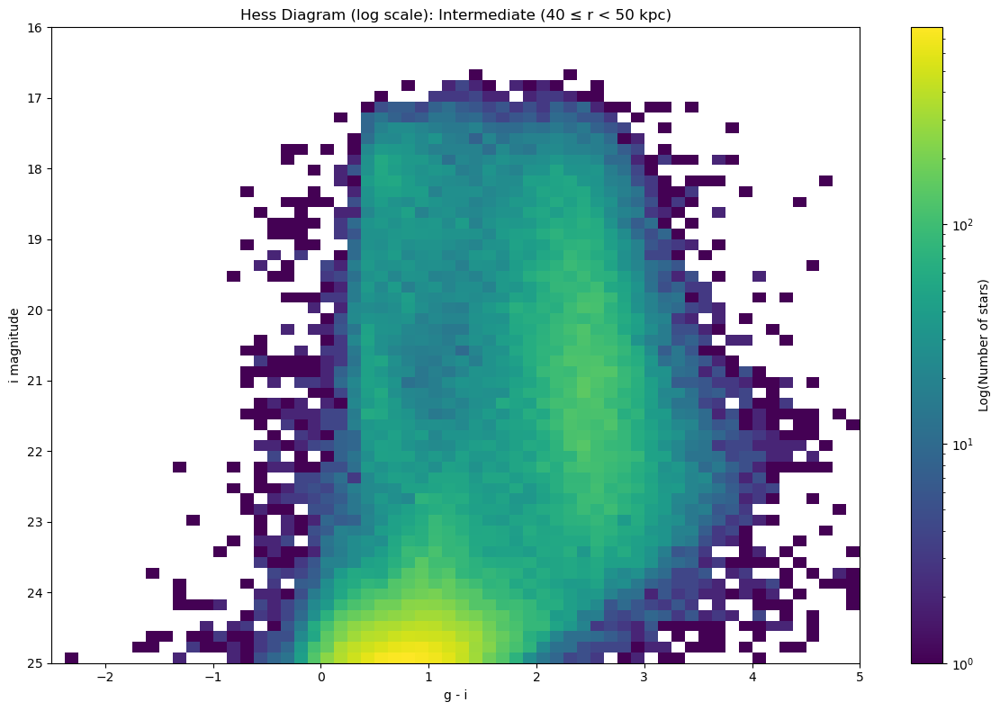

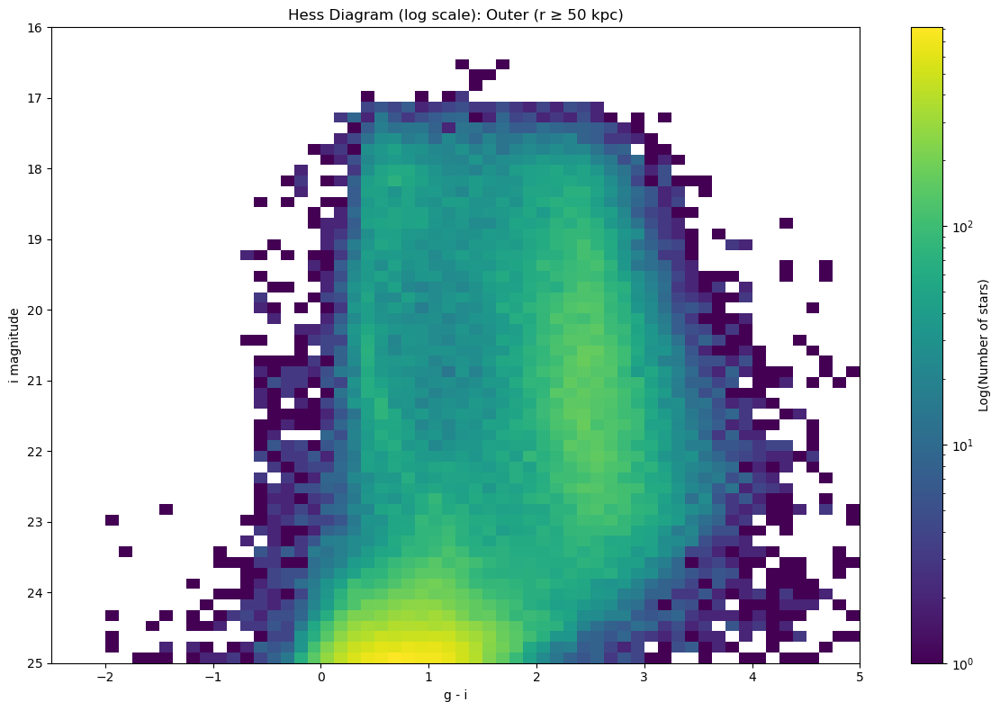

In [55]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LogNorm  # for log color scaling

colors = {'young': 'blue', 'int': 'orange', 'old': 'red', 'young_unconfirmed': 'green'}

radial_bins = {
    'Inner (3 ≤ r < 10 kpc)': (panda['r_deproj_kpc'] >= 3) & (panda['r_deproj_kpc'] < 10),
    'Intermediate (10 ≤ r < 20 kpc)': (panda['r_deproj_kpc'] >= 10) & (panda['r_deproj_kpc'] < 20),
    'Intermediate (20 ≤ r < 30 kpc)': (panda['r_deproj_kpc'] >= 20) & (panda['r_deproj_kpc'] < 30),
    'Intermediate (30 ≤ r < 40 kpc)': (panda['r_deproj_kpc'] >= 30) & (panda['r_deproj_kpc'] < 40),
    'Intermediate (40 ≤ r < 50 kpc)': (panda['r_deproj_kpc'] >= 40) & (panda['r_deproj_kpc'] < 50),
    'Outer (r ≥ 50 kpc)': panda['r_deproj_kpc'] >= 50
}

for label, mask in radial_bins.items():
    subset = panda[mask].copy()
    subset = subset[(subset['color'].notnull()) & (subset['mag'].notnull())]

    plt.figure(figsize=(12, 8))
    plt.hist2d(
        subset['color'], subset['mag'],
        bins=[60, 60],  
        range=[[-2.5, 5], [16, 25]],
        cmap='viridis',
        norm=LogNorm(),  
        cmin=1
    )
    plt.gca().invert_yaxis()
    plt.xlabel('g - i')
    plt.ylabel('i magnitude')
    plt.title(f'Hess Diagram (log scale): {label}')
    plt.colorbar(label='Log(Number of stars)')
    plt.tight_layout()
    plt.show()

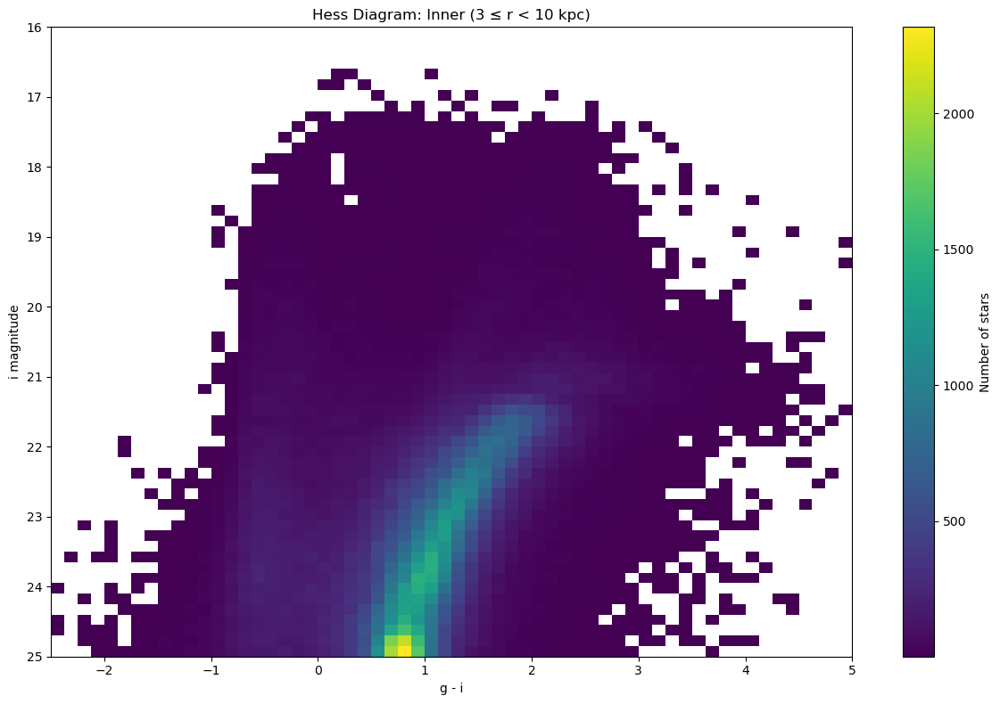

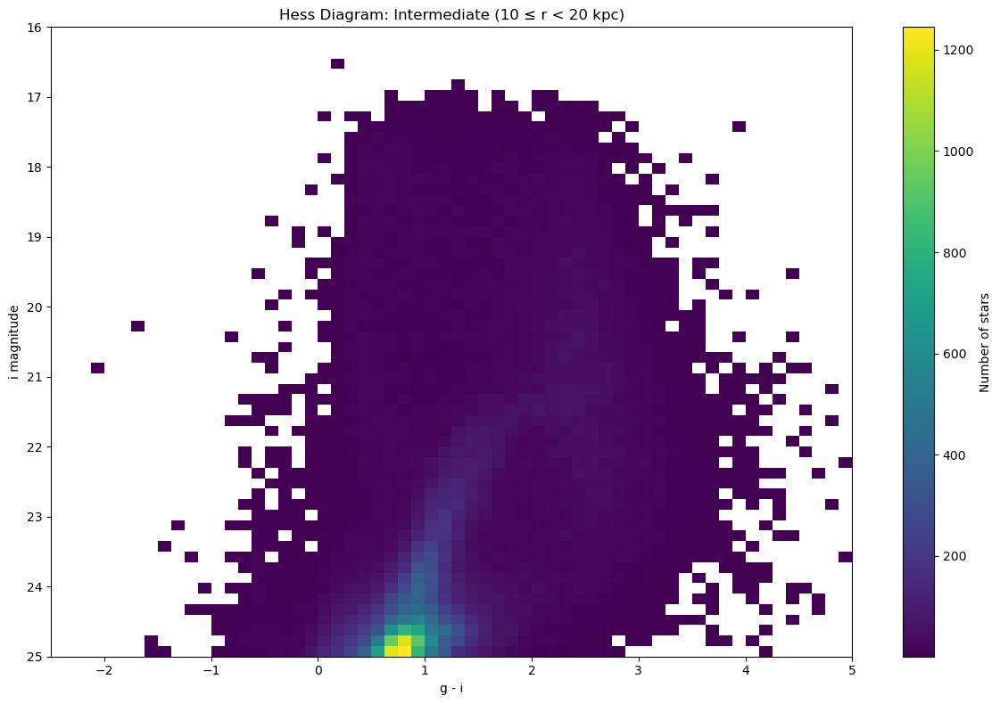

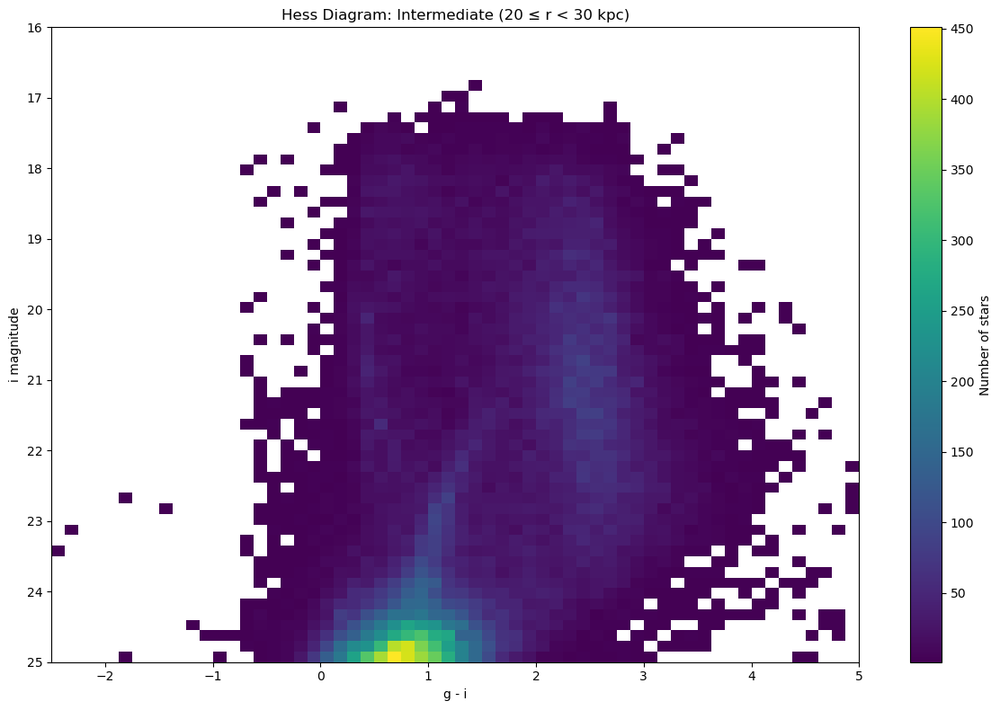

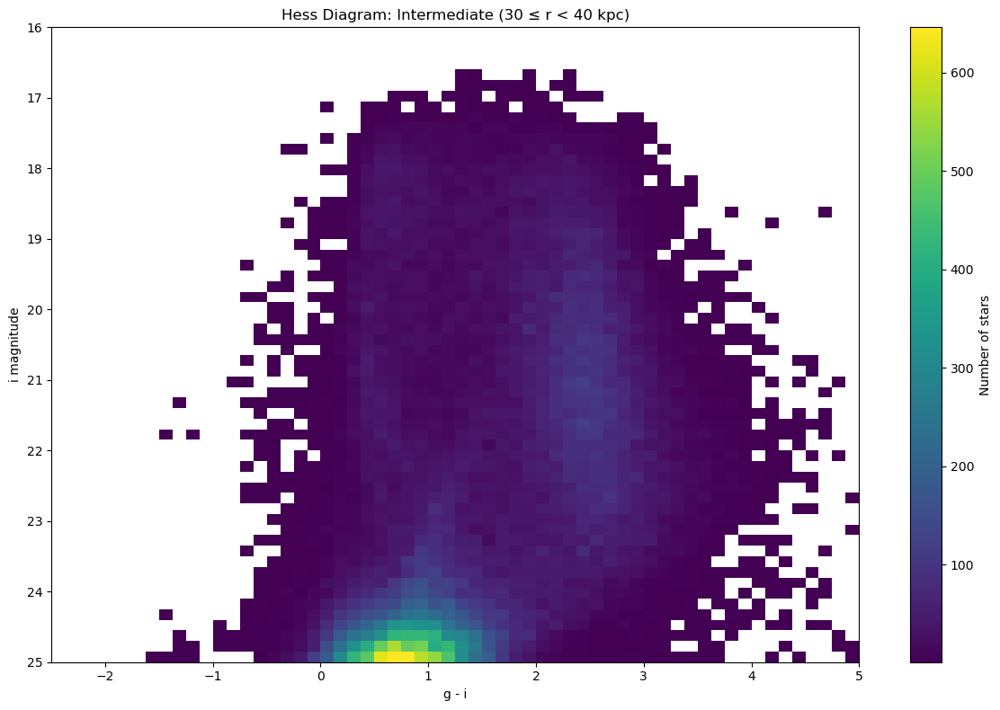

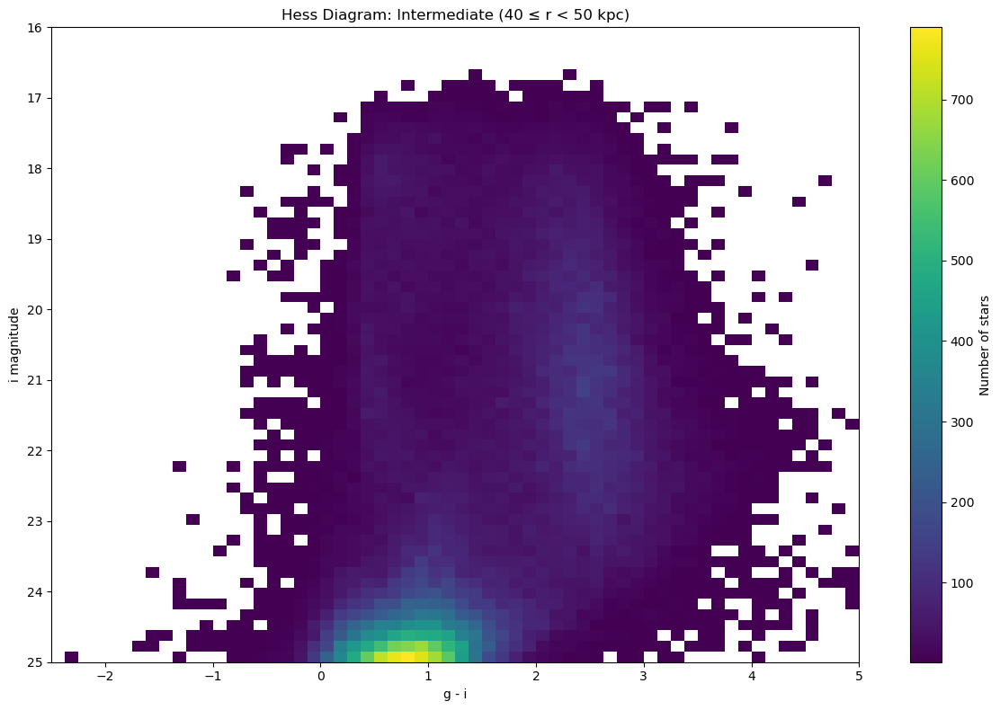

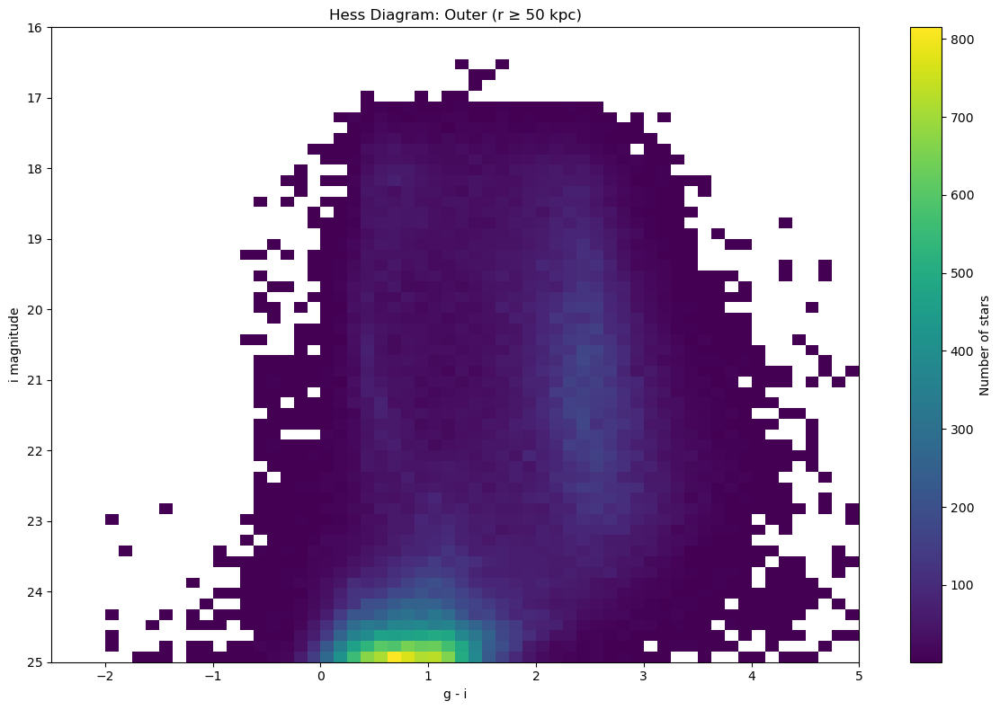

In [56]:
import matplotlib.pyplot as plt
import numpy as np

colors = {'young': 'blue', 'int': 'orange', 'old': 'red', 'young_unconfirmed': 'green'}

radial_bins = {
    'Inner (3 ≤ r < 10 kpc)': (panda['r_deproj_kpc'] >= 3) & (panda['r_deproj_kpc'] < 10),
    'Intermediate (10 ≤ r < 20 kpc)': (panda['r_deproj_kpc'] >= 10) & (panda['r_deproj_kpc'] < 20),
    'Intermediate (20 ≤ r < 30 kpc)': (panda['r_deproj_kpc'] >= 20) & (panda['r_deproj_kpc'] < 30),
    'Intermediate (30 ≤ r < 40 kpc)': (panda['r_deproj_kpc'] >= 30) & (panda['r_deproj_kpc'] < 40),
    'Intermediate (40 ≤ r < 50 kpc)': (panda['r_deproj_kpc'] >= 40) & (panda['r_deproj_kpc'] < 50),
    'Outer (r ≥ 50 kpc)': panda['r_deproj_kpc'] >= 50
}

for label, mask in radial_bins.items():
    subset = panda[mask].copy()
    subset = subset[(subset['color'].notnull()) & (subset['mag'].notnull())]

    plt.figure(figsize=(12, 8))
    plt.hist2d(
        subset['color'], subset['mag'],
        bins=[60, 60],  
        range=[[-2.5, 5], [16, 25]],
        cmap='viridis',
        cmin=1
    )
    plt.gca().invert_yaxis()
    plt.xlabel('g - i')
    plt.ylabel('i magnitude')
    plt.title(f'Hess Diagram: {label}')
    plt.colorbar(label='Number of stars')
    plt.tight_layout()
    plt.show()

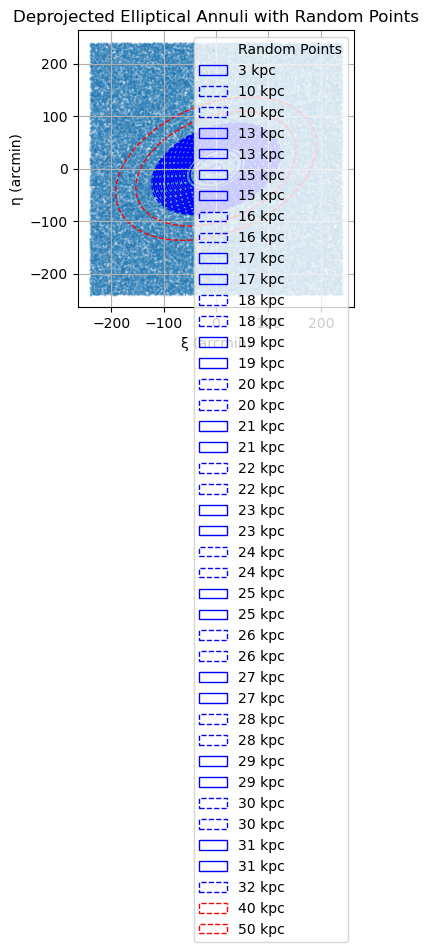


=== Area Comparison for All Bins ===
Bin (kpc)           Analytic Area          Monte Carlo Area     % Diff
---------------------------------------------------------------------------
3-10                       176.01                    179.28       1.86
10-13                      133.46                    126.43      -5.26
13-15                      108.31                    103.97      -4.01
15-16                       59.96                     57.74      -3.69
16-17                       63.83                     63.50      -0.51
17-18                       67.70                     69.12       2.10
18-19                       71.56                     74.30       3.83
19-20                       75.43                     76.90       1.94
20-21                       79.30                     79.63       0.42
21-22                       83.17                     84.67       1.81
22-23                       87.04                     92.59       6.38
23-24                       90.91 

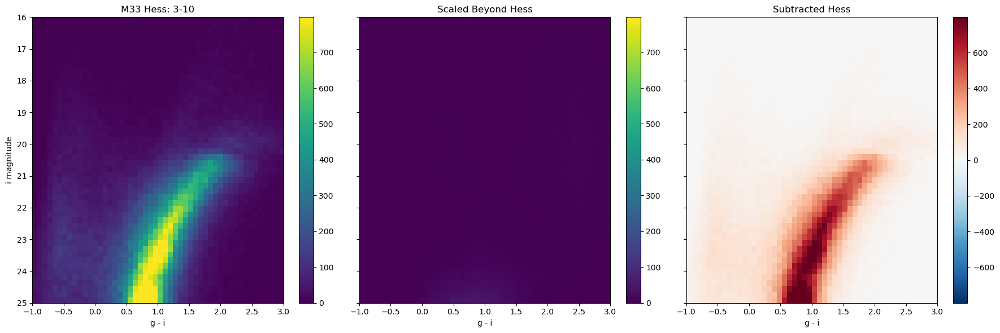

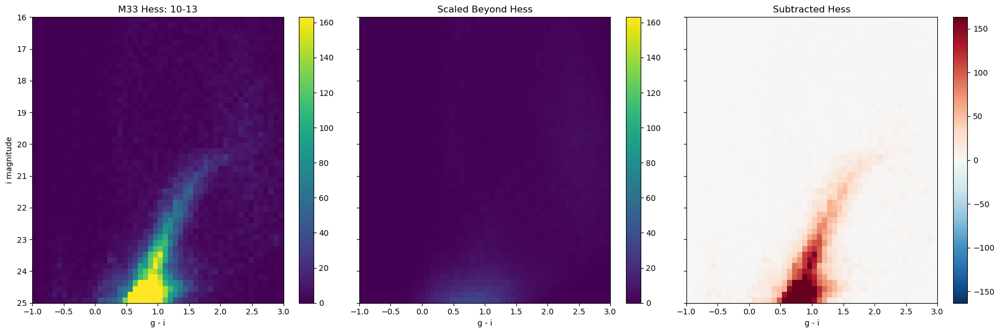

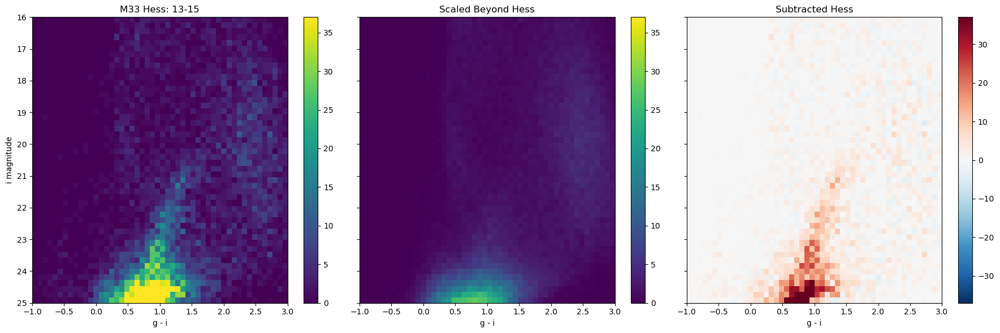

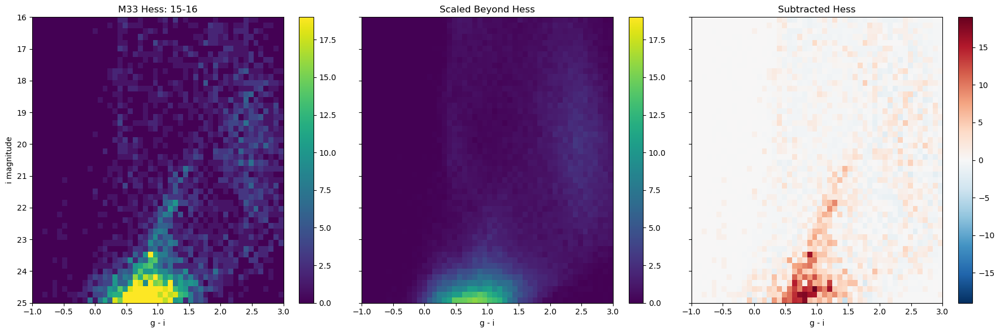

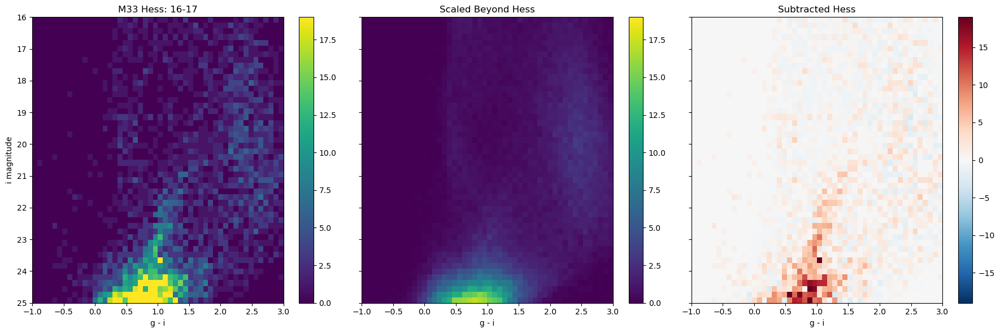

...

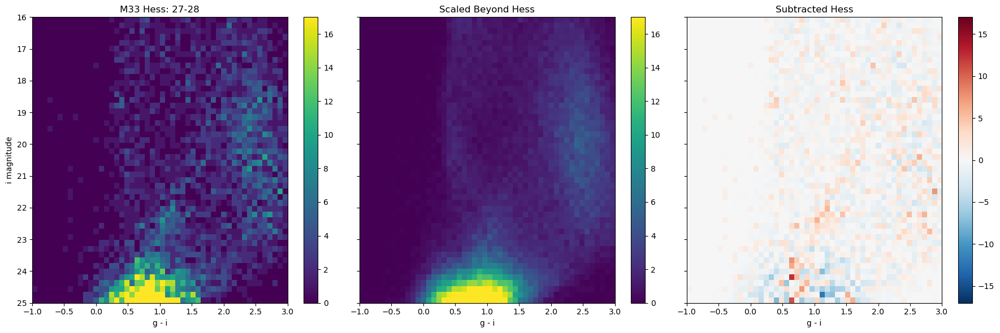

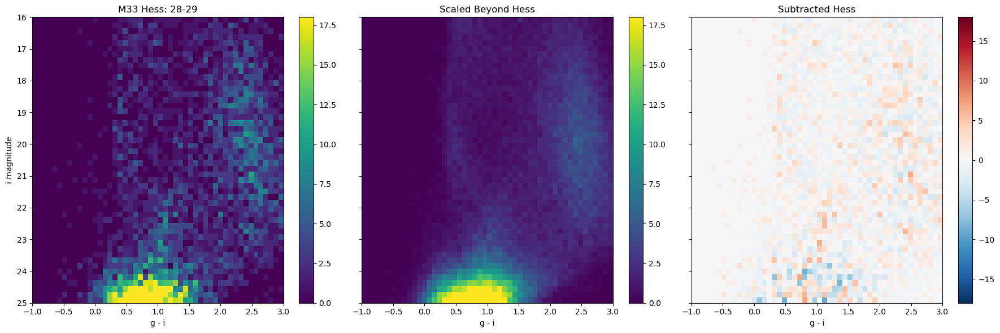

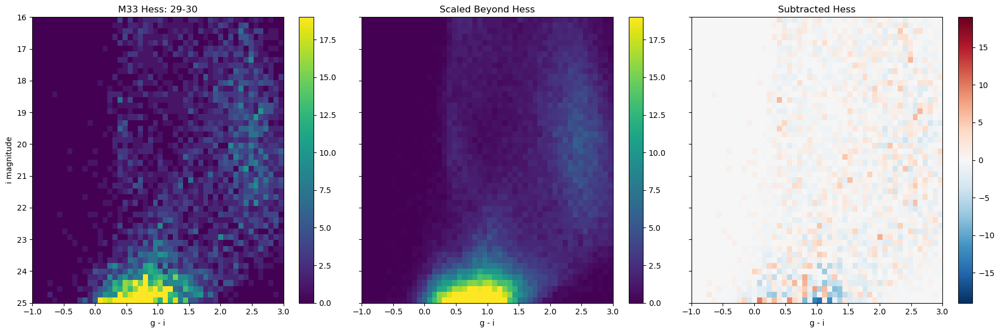

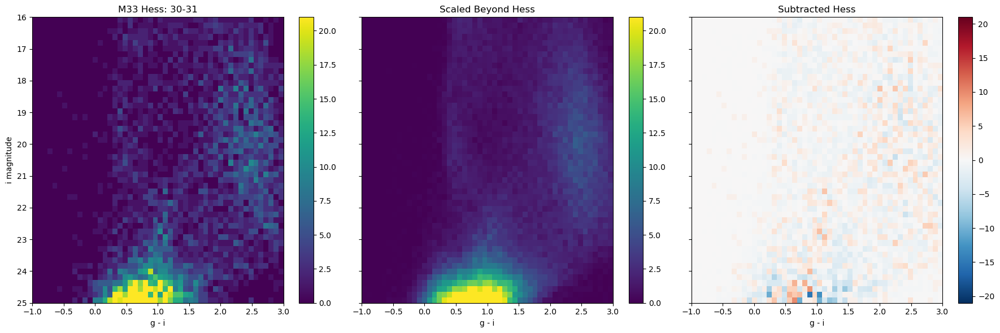

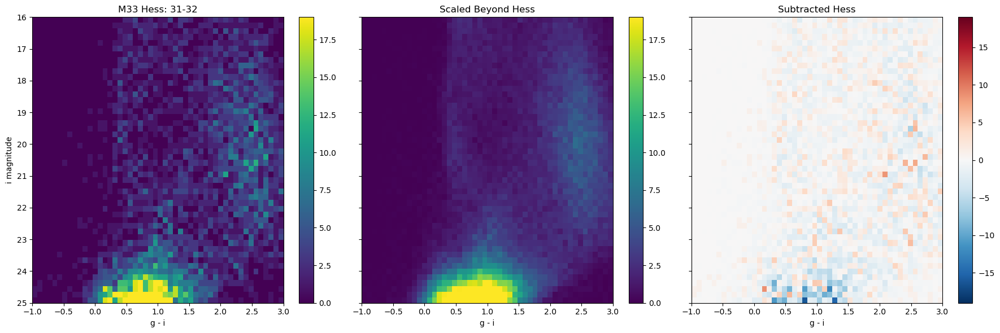

In [60]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.coordinates import SkyCoord
import astropy.units as u
from funcs import *
from matplotlib.patches import Ellipse

# === Load and preprocess FITS data ===
with fits.open("./pandas_goodstar_bright_sr.fits") as hdul:
    data = hdul[1].data
    panda = pd.DataFrame(data.astype(data.dtype.newbyteorder('=')))

panda = panda.rename(columns={'RA': 'RA_DEG', 'Dec': 'DEC_DEG'})
panda = compute_deprojected_radius(panda)

distance_kpc = 859
center = SkyCoord(ra=23.4621 * u.deg, dec=30.6602 * u.deg)
stars = SkyCoord(ra=panda['RA_DEG'].values * u.deg, dec=panda['DEC_DEG'].values * u.deg)
separation_rad = center.separation(stars).radian
panda['projected_radius_kpc'] = separation_rad * distance_kpc

panda['color'] = panda['g'] - panda['i']
panda['mag'] = panda['i']

# === Define Area Functions ===
def elliptical_annulus_area_analytic(a_in_kpc, a_out_kpc, inc_deg):
    inc_rad = np.deg2rad(inc_deg)
    return np.pi * (a_out_kpc**2 - a_in_kpc**2) * np.cos(inc_rad)

def estimate_area_and_plot_annuli(n_points=1_000_000, max_radius_kpc=60,
                                   distance_kpc=859, PA_deg=22, inc_deg=52,
                                   area_rings=[], plot_radii_kpc=[]):
    def kpc_to_arcmin(kpc):
        return np.rad2deg(kpc / distance_kpc) * 60

    max_radius_rad = max_radius_kpc / distance_kpc
    max_radius_arcmin = np.rad2deg(max_radius_rad) * 60
    xi = np.random.uniform(-max_radius_arcmin, max_radius_arcmin, n_points)
    eta = np.random.uniform(-max_radius_arcmin, max_radius_arcmin, n_points)

    PA_rad = np.deg2rad(PA_deg)
    inc_rad = np.deg2rad(inc_deg)
    xi_rot = xi * np.cos(PA_rad) + eta * np.sin(PA_rad)
    eta_rot = -xi * np.sin(PA_rad) + eta * np.cos(PA_rad)
    eta_deproj = eta_rot / np.cos(inc_rad)
    r_arcmin = np.sqrt(xi_rot**2 + eta_deproj**2)

    areas = {}
    for a_in_kpc, a_out_kpc in area_rings:
        r_in = kpc_to_arcmin(a_in_kpc)
        r_out = kpc_to_arcmin(a_out_kpc)
        mask = (r_arcmin >= r_in) & (r_arcmin < r_out)
        n_inside = np.sum(mask)
        box_area_arcmin2 = (2 * max_radius_arcmin)**2
        arcmin2_to_sr = (np.pi / (180 * 60))**2
        box_area_sr = box_area_arcmin2 * arcmin2_to_sr
        box_area_kpc2 = box_area_sr * (distance_kpc ** 2)
        area_estimate = (n_inside / n_points) * box_area_kpc2
        areas[f"{a_in_kpc}-{a_out_kpc}"] = area_estimate

    fig, ax = plt.subplots(figsize=(7, 7))
    ax.scatter(xi, eta, s=0.2, alpha=0.3, label='Random Points')
    for r_kpc in plot_radii_kpc:
        a = kpc_to_arcmin(r_kpc)
        b = a * np.cos(inc_rad)
        color = 'blue' if r_kpc < 40 else 'red'
        style = '--' if r_kpc % 2 == 0 else '-'
        ellipse = Ellipse((0, 0), width=2*a, height=2*b, angle=PA_deg,
                          edgecolor=color, linestyle=style, fill=False, label=f"{r_kpc} kpc")
        ax.add_patch(ellipse)

    ax.set_xlabel("ξ (arcmin)")
    ax.set_ylabel("η (arcmin)")
    ax.set_title("Deprojected Elliptical Annuli with Random Points")
    ax.set_aspect('equal')
    ax.legend(loc='upper right')
    ax.grid(True)
    plt.tight_layout()
    plt.show()

    return areas

def make_hess(df, bins=(50, 50)):
    hist, xedges, yedges = np.histogram2d(df['color'], df['mag'], bins=bins, range=[[-1, 3], [18, 25]])
    return hist

# === Define bins ===
radial_bins_kpc = [(3, 10), (10, 13), (13, 15), (15, 16)] + [(r, r + 1) for r in range(16, 32)]
beyond_bin = (40, 50)
all_bins = radial_bins_kpc + [beyond_bin]

area_results = estimate_area_and_plot_annuli(
    n_points=100_000,
    max_radius_kpc=60,
    distance_kpc=859,
    PA_deg=22,
    inc_deg=52,
    area_rings=all_bins,
    plot_radii_kpc=[r for pair in all_bins for r in pair]
)

# === Print Area Comparison Table ===
print("\n=== Area Comparison for All Bins ===")
print(f"{'Bin (kpc)':<12} {'Analytic Area':>20} {'Monte Carlo Area':>25} {'% Diff':>10}")
print("-" * 75)
for (r_in, r_out) in all_bins:
    key = f"{r_in}-{r_out}"
    area_mc = area_results[key]
    area_an = elliptical_annulus_area_analytic(r_in, r_out, inc_deg=52)
    pct_diff = 100 * (area_mc - area_an) / area_an
    print(f"{key:<12} {area_an:>20.2f} {area_mc:>25.2f} {pct_diff:>10.2f}")

# === Subtract and Plot Hess Diagrams in Linear Scale ===
beyond_area = area_results[f"{beyond_bin[0]}-{beyond_bin[1]}"]
beyond_df = panda[(panda['r_deproj_kpc'] >= beyond_bin[0]) & (panda['r_deproj_kpc'] < beyond_bin[1])]
hess_beyond = make_hess(beyond_df)

for r_in, r_out in radial_bins_kpc:
    label = f"{r_in}-{r_out}"
    bin_df = panda[(panda['r_deproj_kpc'] >= r_in) & (panda['r_deproj_kpc'] < r_out)]
    hess_m33 = make_hess(bin_df)

    scale = area_results[label] / beyond_area
    hess_scaled_beyond = scale * hess_beyond
    hess_subtracted = hess_m33 - hess_scaled_beyond

    vlim = np.percentile(np.abs(hess_m33), 99)

    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

    im0 = axes[0].imshow(hess_m33.T, origin='upper', aspect='auto',
                         extent=[-1, 3, 25, 16], cmap='viridis', vmin=0, vmax=vlim)
    axes[0].set_title(f"M33 Hess: {label}")
    axes[0].set_xlabel('g - i')
    axes[0].set_ylabel('i magnitude')
    fig.colorbar(im0, ax=axes[0])

    im1 = axes[1].imshow(hess_scaled_beyond.T, origin='upper', aspect='auto',
                         extent=[-1, 3, 25, 16], cmap='viridis', vmin=0, vmax=vlim)
    axes[1].set_title("Scaled Beyond Hess")
    axes[1].set_xlabel('g - i')
    fig.colorbar(im1, ax=axes[1])

    im2 = axes[2].imshow(hess_subtracted.T, origin='upper', aspect='auto',
                         extent=[-1, 3, 25, 16], cmap='RdBu_r',
                         vmin=-vlim, vmax=vlim)
    axes[2].set_title("Subtracted Hess")
    axes[2].set_xlabel('g - i')
    fig.colorbar(im2, ax=axes[2])

    plt.tight_layout()
    plt.show()